<a href="https://colab.research.google.com/github/se-won-do/python-class/blob/main/JTWC_download.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 2장 best-track 자료를 사용하여 태풍 분석하기


# 이번시간 실습

1. 2018년 전체 태풍의 Track 그려보기   (basemap 위에)


2. 자기가 원하는 태풍 사례를 선정하고 Track을 그리고 매 00 시는 따로 표시하기
   (색깔, 크기, 모양 등 다양하게 표시해도 됩니다.)


  2-1. 앞서 그렸던 해수면온도 (SST) 위에 태풍 Track을 그려보기


  2-2. 태풍 사례에서 풍속과 기압의 상관관계 그려보기



ㅇㅇㅇ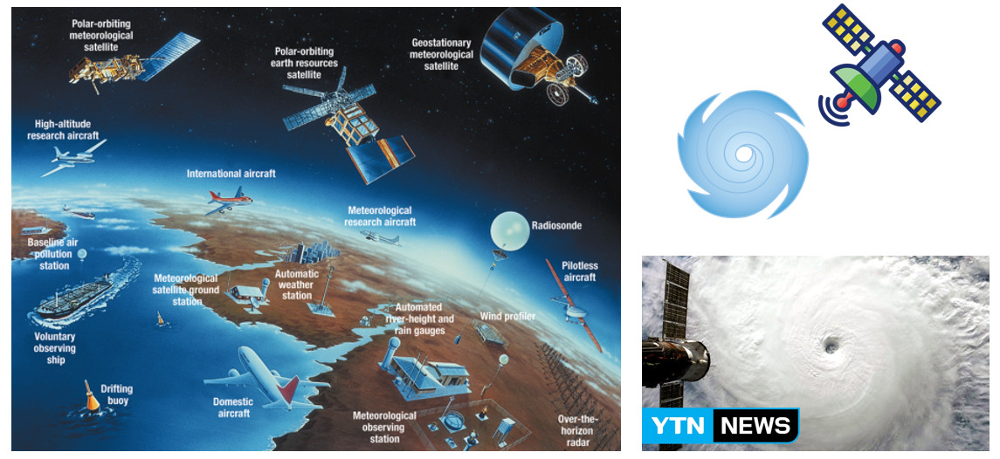

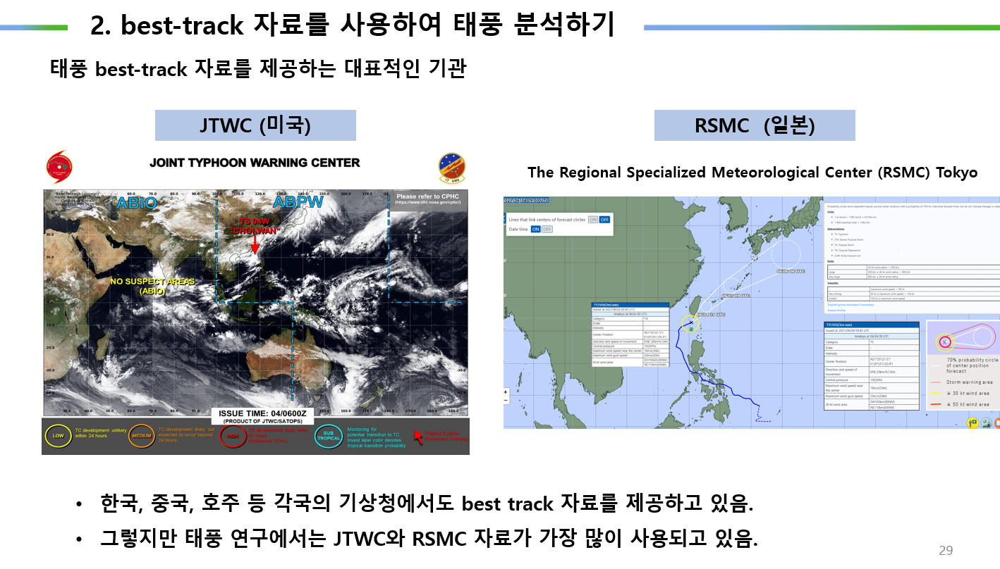

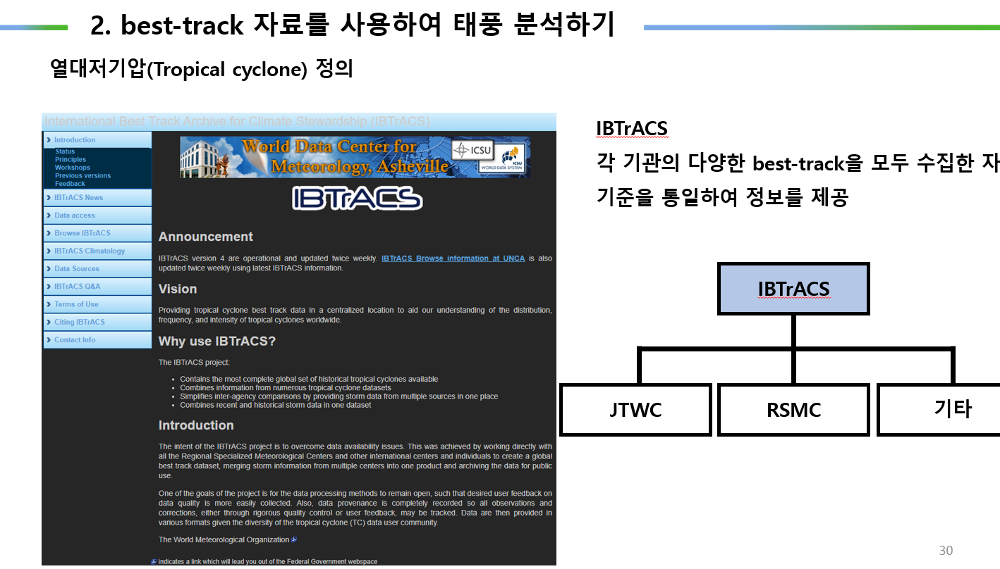

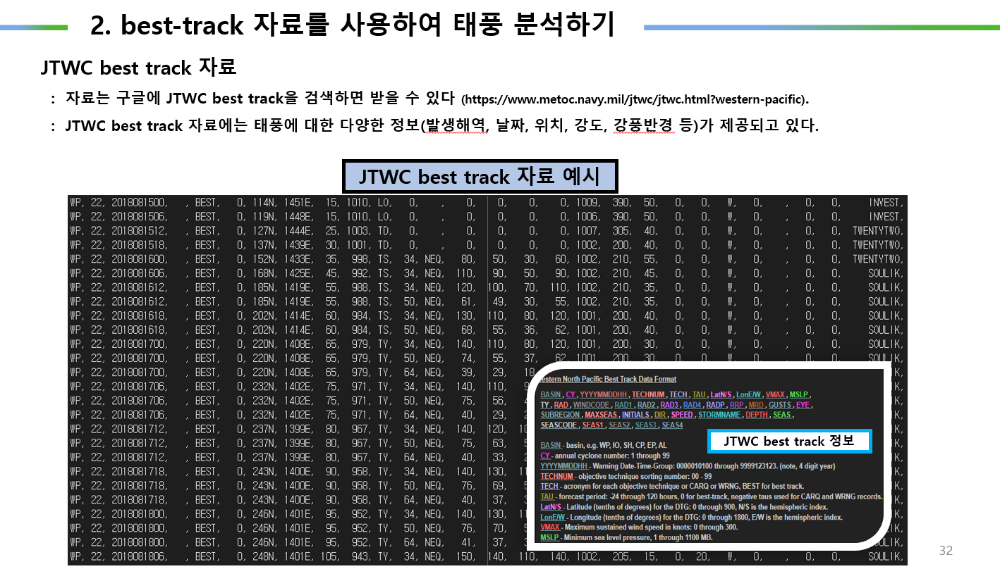

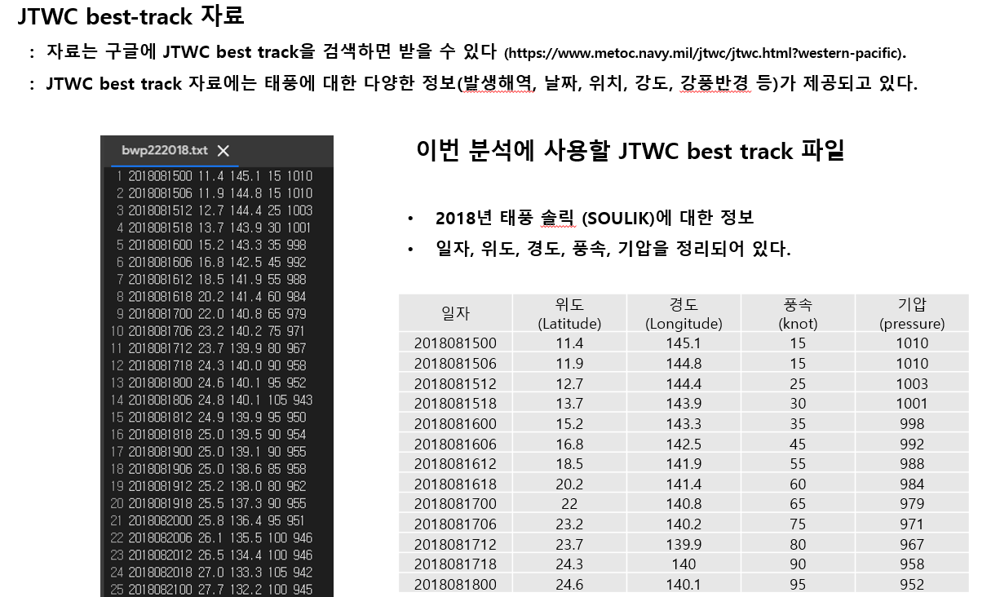

##JTWC best-track 자료를 다운받고 각 폴더에 정리하는 코드

여기서 2개를 사용자가 원하는대로 설정해야한다.
1. 경로 (Path)
2. best-track 다운로드 기간 

저장된 파일은 북서태평양(WNP)의 태풍의 정보 중 시간, 경도, 위도, 풍속, 기압만을 저장합니다. 

코드가 수행되는데 약 1분 20초 가량 소요됩니다.


JTWC best-track 자료를 다운받데 필요한 Libaray 를 설치 및 불러오기

In [ ]:
!pip install wget

import wget
import zipfile
import os

  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9672 sha256=ce5f57da9e4f53b8b37df98fafcce35bb51fe82197202da3799e994375a85c46
  Stored in directory: /root/.cache/pip/wheels/a1/b6/7c/0e63e34eb06634181c63adacca38b79ff8f35c37e3c13e3c02
Successfully built wget


사용자가 원하는 JTWC best-track 저장위치 및 다운로드 기간 설정

(colab 에서 드라이브 마운트를 할 경우 기본적인 저장위치)

In [ ]:
PATH = '/content/drive/MyDrive/TC_study/best-track/JTWC/'
start_year = 2018
end_year = 2019 + 1

os.makedirs(PATH)
os.mkdir(PATH +'Original_Data')

JTWC best-track 자료를 다운받고 각 폴더에 저장

In [ ]:
for i in range(start_year,end_year):       # 연도설정입니다. 

    url = "https://www.metoc.navy.mil/jtwc/products/best-tracks/" + str(i) + "/" + str(i) + "s-bwp/bwp" + str(i) + ".zip"
    
    wget.download(url, out = PATH )     # JTWC 자료 다운로드
    
    
    os.mkdir(PATH + 'Original_Data/bwp' + str(i))     # 파일 디렉토리 만들기 
    os.mkdir(PATH + 'best_track_' + str(i) + '/')


    fantasy_zip = zipfile.ZipFile(PATH +'bwp' + str(i) +'.zip')              # JTWC 자료 알집 풀 자료  
    fantasy_zip.extractall(PATH +'Original_Data/bwp' + str(i) + '/')     # JTWC 자료 알집 풀고 저장 위치  
    fantasy_zip.close()                                                      # JTWC 자료 알집 close  
    
    os.remove(PATH + 'bwp' + str(i) + '.zip')       # JTWC 자료 알집을 풀었으니 삭제 

# =============================================================================
#  JTWC 중 WP TC만을 읽고 시간, 경도, 위도, 풍속, 기압만 뽑아 track_[year] 에 저장

    FILE_ID = os.listdir(PATH +'Original_Data/bwp' + str(i) + '/')
    

    for kk in FILE_ID:      # 각 해당 연도에 TC 리스트를 읽고 bwp가 아니면 다음 강제로 for를 돌림
        if kk[0:3] != 'bwp':
            continue
            
        TC_data = []
        TC_data_list = []
        
        with open(PATH +'Original_Data/bwp' + str(i) + '/' + kk,'r') as f: 
            for line in f:
            
                s = line.strip().split(',')
                
                   
                if s[7][-1] =='W':
                    lon = 360 - (float(s[7][:-1])*0.1)
                else:
                    lon = float(s[7][:-1])*0.1

                date = int(s[2])
                lat = float(s[6][:-1])*0.1
                WS = int(s[8])

                
                if i > 2000:
                    Press = int(s[9])
                    TC_data.append([date, lat, lon, WS, Press])
                else:
                    TC_data.append([date, lat, lon, WS])

            
# =============================================================================
# 파일을 저장하는 부분 
        with open(PATH +'best_track_'  + str(i) + '/bwp' + ('%2.2d' %(int(kk[3:5]))) + str(i) + '.txt','w') as outf :
            for iii in range(len(TC_data)):
    
                if TC_data[iii][0] not in TC_data_list:   # 중복되는 시간을 배제하기 위한 if 문 사용
      
                  if int(i) > 2000:

                      outf.write('%s %3.1f %3.1f %s %s \n' % (TC_data[iii][0],TC_data[iii][1],TC_data[iii][2],TC_data[iii][3],TC_data[iii][4]))
                  else:
                      outf.write('%s %3.1f %3.1f %s \n' % (TC_data[iii][0],TC_data[iii][1],TC_data[iii][2],TC_data[iii][3]))


                  TC_data_list.append(TC_data[iii][0])   # 중복되는 시간을 배제하기 위한 if 문 사용하기 위한 조건제시 
# =============================================================================

In [ ]:
#!rm -rf /content/drive/MyDrive/TC_study/best-track/JTWC/

## 2018년 19호 태풍 솔릭 (SOULIK) 시각화

태풍을 시각화 하는데 필요한 library

In [ ]:
!pip install basemap
!pip install basemap-data-hires     

%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

     |████████████████████████████████| 858 kB 6.7 MB/s 
     |████████████████████████████████| 6.3 MB 30.5 MB/s 
     |████████████████████████████████| 30.5 MB 1.5 MB/s 
     |████████████████████████████████| 219 kB 62.4 MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.3-py3-none-any.whl size=37324 sha256=7586056ce07e4661cce88507f406e8bfa04a29c37eb16f2052307fa0b1aa30a7
  Stored in directory: /root/.cache/pip/wheels/43/f8/87/53c8cd41545ba20e536ea29a8fcb5431b5f477ca50d5dffbbe
Successfully built pyshp


     |████████████████████████████████| 91.1 MB 94 kB/s 


best-track을 불러와 태풍에 대한 정보를 정의

In [ ]:
path = '/content/drive/MyDrive/TC_study/best-track/JTWC/best_track_2018/'        
TC_path = 'bwp222018.txt'

TC_data = np.loadtxt(path + TC_path)
                                                                               
# 태풍에 대한 정보 정의
Time = TC_data[:,0]  
Lat = TC_data[:,1]
Lon = TC_data[:,2]
Wind = TC_data[:,3]
Press = TC_data[:,4]


태풍에 관한 가장 기본적인 시각화

1. 최대풍속, 중심기압, 태풍진로, 태풍위치 등

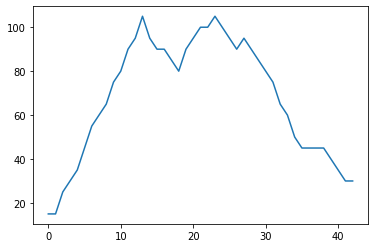

In [145]:
# 태풍 최대풍속 시각화

plt.plot(Wind)

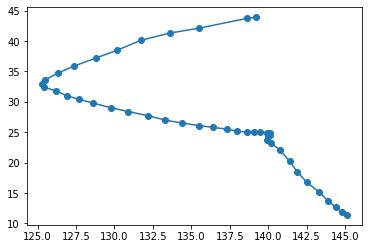

In [ ]:
# 태풍 중심위치를 연결한 (태풍의 진로) 시각화

plt.plot(Lon,Lat)
plt.scatter(Lon,Lat)

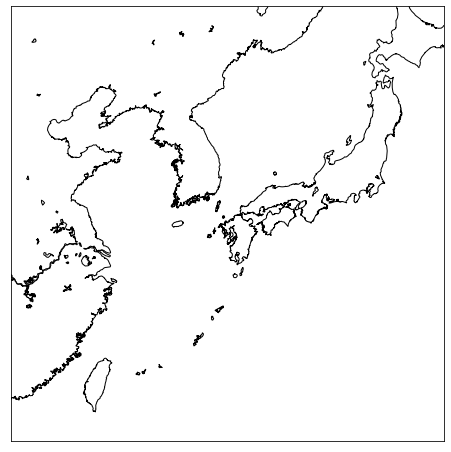

In [144]:
# 태풍의 진로 (Track) 을 지도위에 시각화

plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=45, llcrnrlat=20, llcrnrlon=115, urcrnrlon=145)
map.drawcoastlines()


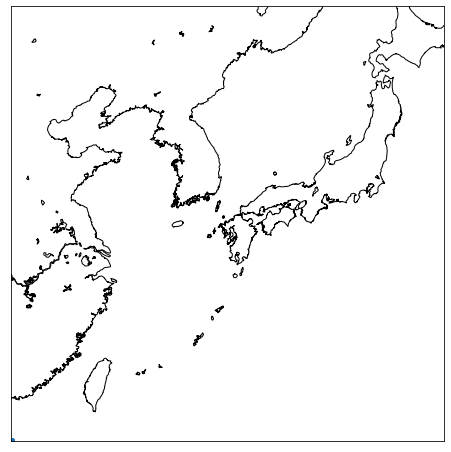

In [143]:
plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=45, llcrnrlat=20, llcrnrlon=115, urcrnrlon=145)
map.drawcoastlines()

# 위에서 하용하던 Lon , Lat 을 그대로 사용하면 그려지지 않음
plt.plot(Lon,Lat)
plt.scatter(Lon,Lat)


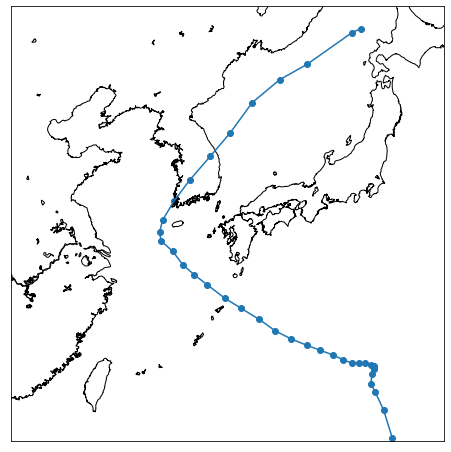

In [ ]:
plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=45, llcrnrlat=20, llcrnrlon=115, urcrnrlon=145)    # 지구를 그리는 도법 = projection, 해상도 = i 영역을 설정 )
map.drawcoastlines()      # 해안선 그리기


# basemap 에 맞게 lon, lat 을 변경해이 필요함
lon, lat = map(Lon,Lat)

plt.plot(lon,lat)
plt.scatter(lon, lat)


# 이번시간 실습

1. 2018년 전체 태풍의 Track 그려보기   (basemap 위에)





In [ ]:
Time_6h_id = []

for i in np.arange(np.size(Time)):
  #print(round(Time[i]))

  if str( round(Time[i]) ) [-2:] == '00':
    #print('hello')
    Time_6h_id.append(i)

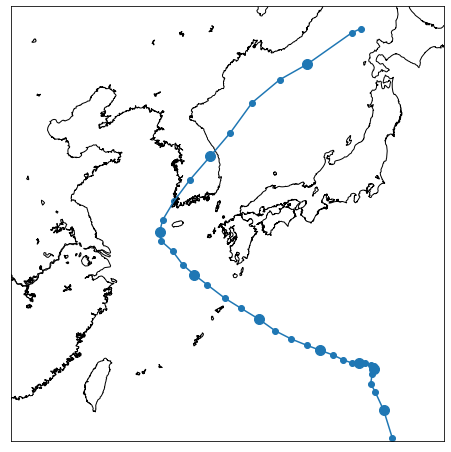

In [ ]:
plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=45, llcrnrlat=20, llcrnrlon=115, urcrnrlon=145)
map.drawcoastlines()


lon, lat = map(Lon,Lat)

plt.plot(lon,lat)
plt.scatter(lon, lat)

plt.scatter(lon[Time_6h_id], lat[Time_6h_id],s=100,color='C0')

# 이번시간 실습


2. 자기가 원하는 태풍 사례를 선정하고 Track을 그리고 매 00 시는 따로 표시하기
   (색깔, 크기, 모양 등 다양하게 표시해도 됩니다.)





   


태풍자료를 사용하여 태풍최대풍속(Wind)과 중심기압(Pressure) 을 시계열로 분석하기


Text(0.5, 1.0, 'Wind & Pressure')

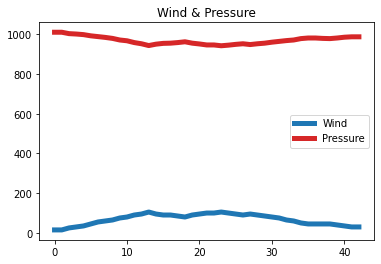

In [127]:
import matplotlib.pyplot as plt

# 태풍 최대풍속과 중심최저기압 시각화

plt.plot(Wind,color='C0',lw=5)   # label 을 설정해두면 legend 를 편리하게 사용할 수 있다.
plt.plot(Press,color='C3',lw=5)

#fig.legend()
plt.legend(['Wind','Pressure'])     # 그림 범례 (legend) 지정
plt.title('Wind & Pressure')        # 그림 제목 지정


# 두 값의 차이가 매우 크게 나타남. 
# 기압은 900~1000  hPa
# 풍속은 0~50      m/s

# 따라서 이러한 방법으로는 분석하기가 어려움

Text(0.5, 1.0, 'Wind & Pressure')

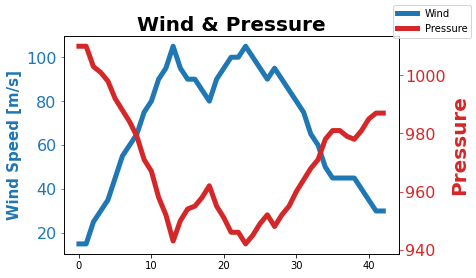

In [142]:
import matplotlib.pyplot as plt
fig, ax1 = plt.subplots()         
ax2 = ax1.twinx()                 # y축을 두개로 나누어 시각화 방법

#line1 = ax1.plot(Wind,color='C0',lw=5, label='Wind')   # label 을 설정해두면 legend 를 편리하게 사용할 수 있다.
line1 = ax1.plot(Wind,color='C0',lw=5)   # label 을 설정해두면 legend 를 편리하게 사용할 수 있다.
ax1.tick_params(axis='y', colors="C0")   # 색깔 조정
ax1.tick_params(axis='y', labelsize=16)  # 크기 조정
ax1.set_ylabel('Wind Speed [m/s]',fontsize=15,color='C0',fontweight='bold')



#line2 = ax2.plot(Press,color='C3',lw=5, label='Press')
line2 = ax2.plot(Press,color='C3',lw=5)
ax2.tick_params(axis='y', colors="C3")   # 색깔 조정
ax2.tick_params(axis='y', labelsize=16)  # 크기 조정
ax2.set_ylabel('Pressure',fontsize=20,color='C3',fontweight='bold')




#fig.legend()
fig.legend(['Wind','Pressure'])
plt.title('Wind & Pressure')

plt.title('Wind & Pressure',fontsize=20,fontweight='bold')





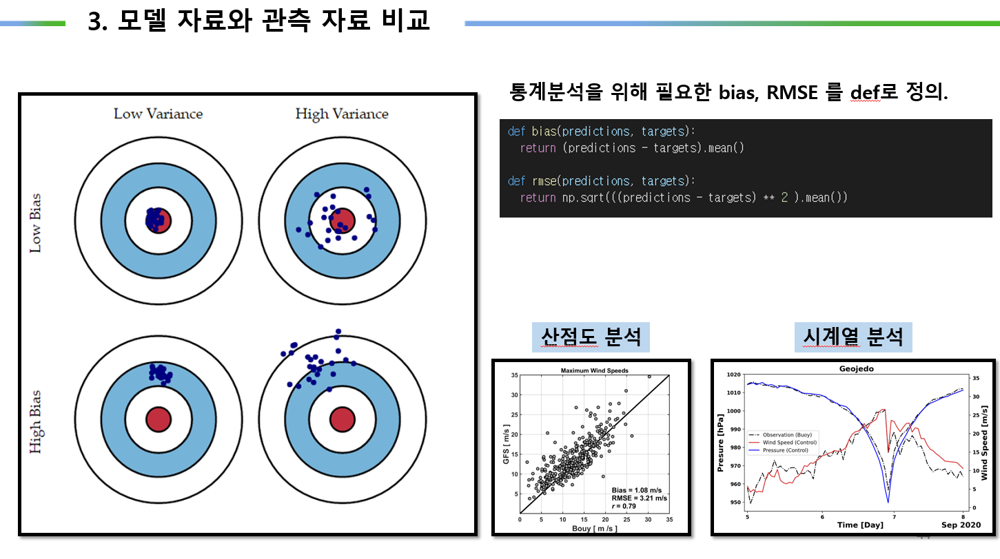

In [ ]:
# 간단한 통계분석을 위한 툴 
# bias, RMSE, corr 

def bias(predictions, targets):
  return (predictions - targets).mean()

def rmse(predictions, targets):
  return np.sqrt(((predictions - targets) ** 2 ).mean())

def corr(predictions, targets):
  cov = (np.sum( predictions * targets ) - len(predictions) * np.mean(predictions) * np.mean(targets)) / len(predictions)
  return cov / (np.std(predictions) * np.std(targets) )

In [ ]:
#print( rmse(Wind, Press) )
#print( bias(Wind, Press) )
print( np.corrcoef(Wind,Press)[0,1] )

-0.9694916127753226


# 이번시간 실습

1. 2018년 전체 태풍의 Track 그려보기   (basemap 위에)


2. 자기가 원하는 태풍 사례를 선정하고 Track을 그리고 매 00 시는 따로 표시하기
   (색깔, 크기, 모양 등 다양하게 표시해도 됩니다.)


  2-1. 앞서 그렸던 해수면온도 (SST) 위에 태풍 Track을 그려보기


  2-2. 태풍 사례에서 풍속과 기압의 상관관계 그려보기

# 3장 모델 자료와 관측 자료 비교하기


> 3장에서의 목표  (모델 자료와 관측 자료 비교하기)

- 기상청 해양기상부이 관측 자료와 위치 시각화

- 모델과 관측 자료 비교하기

- 관측과 비교한 모델의 통계분석





## 모델과 관측은 무엇인가?

수치 모델 (numerical modeling) 이란 무엇인가?? 
 
  



[네이버 지식백과] 수치모델은 컴퓨터 시뮬레이션을 통하여 복잡한 해양 현상을 이해하거나 예측하기 위해여 활용하는 기법이다. 해양의 물리 또는 생화학적 특성 변화를 표현하는 수식의 해를, 주어진 조건하에서 컴퓨터를 이용하여 계산한다. 



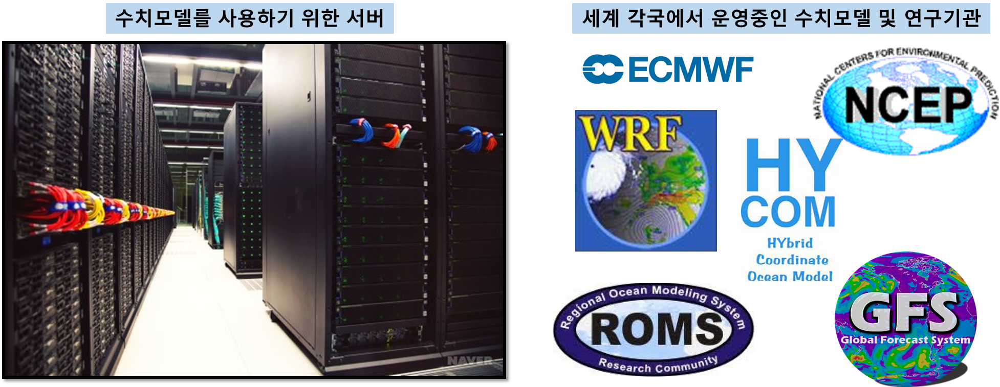

관측 (Observation) 이란 무엇인가?


[네이버 지식백과] 육안이나 기계로 자연 현상 특히 천체나 기상의 상태, 추이, 변화 따위를 관찰하여 측정하는 일.

해양에서는 과학적인 정보를 얻을 목적으로 행하는 
관측으로 해수의 운동, 수질, 생물, 해저와 지각을 대상으로 한 관측이 있다. 





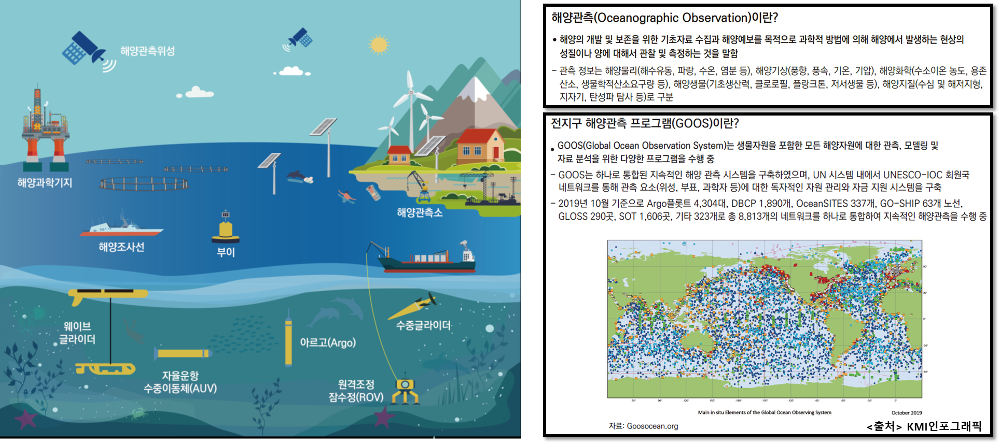

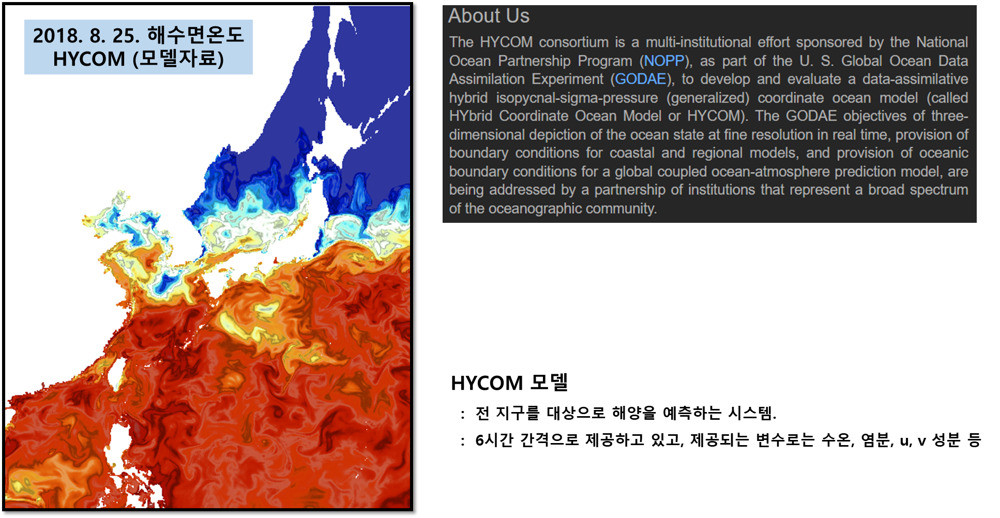

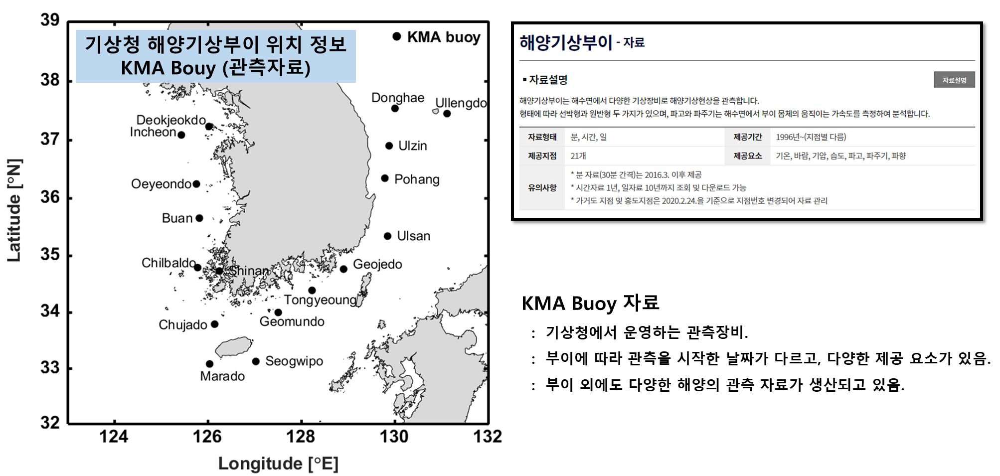

# 기상청 기상자료개방포털

https://data.kma.go.kr/data/sea/selectBuoyRltmList.do?pgmNo=52

## 모델과 관측을 비교하기 위한 통계분석

In [ ]:
# 간단한 통계분석을 위한 툴 
# bias, RMSE, corr 

def bias(predictions, targets):
  return (predictions - targets).mean()

def rmse(predictions, targets):
  return np.sqrt(((predictions - targets) ** 2 ).mean())

def corr(predictions, targets):
  cov = (np.sum( predictions * targets ) - len(predictions) * np.mean(predictions) * np.mean(targets)) / len(predictions)
  return cov / (np.std(predictions) * np.std(targets) )

In [ ]:
# 한국 기상청 (KMA) 해양관측부이 자료 불러오기

KMA_Buoy_loc = pd.read_csv('/content/drive/MyDrive/TC_study/model_Obs_data/KMA_Buoy_location_kor.txt')

KMA_Buoy_loc

,22101\t37.2361\t126.0188\t 덕적도\tDeokjekdo
0,22102\t34.7933\t125.7769\t 칠발도\tChilbaldo
1,22103\t34.0014\t127.5014\t 거문도\tGeomundo
2,22104\t34.7667\t128.9\t 거제도\tGeojedo
3,22105\t37.5442\t130.01\t 동해\tDonghae
4,22106\t36.35\t129.7833\t 포항\tPohang
5,22107\t33.0833\t126.0333\t 마라도\tMarado
6,22108\t36.25\t125.75\t 외연도 \tOeyeondo
7,22184\t33.7936\t126.1411\t 추자도\tChujado
8,22186\t35.6586\t125.8139\t 부안\tBuan
9,22187\t33.1281\t127.0228\t 서귀포\tSeogwipo


In [ ]:
# 한국 기상청 (KMA) 해양관측부이 자료 불러오기 ( 분석이 편리하도록 )

KMA_Buoy_loc = pd.read_csv('/content/drive/MyDrive/TC_study/model_Obs_data/KMA_Buoy_location_kor.txt',sep='\t',header=None)

KMA_Buoy_loc



,0,1,2,3,4
0,22101,37.2361,126.0188,덕적도,Deokjekdo
1,22102,34.7933,125.7769,칠발도,Chilbaldo
2,22103,34.0014,127.5014,거문도,Geomundo
3,22104,34.7667,128.9000,거제도,Geojedo
4,22105,37.5442,130.0100,동해,Donghae
5,22106,36.3500,129.7833,포항,Pohang
6,22107,33.0833,126.0333,마라도,Marado
7,22108,36.2500,125.7500,외연도,Oeyeondo
8,22184,33.7936,126.1411,추자도,Chujado
9,22186,35.6586,125.8139,부안,Buan


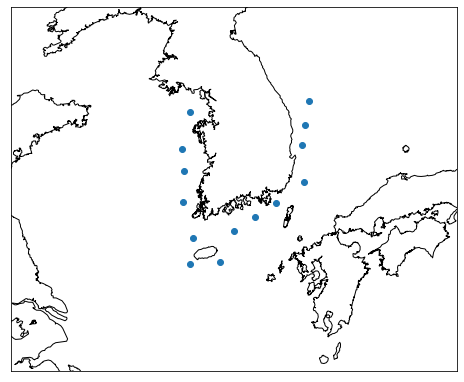

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap


plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=40, llcrnrlat=30, llcrnrlon=120, urcrnrlon=135)
map.drawcoastlines()

KMA_Buoy_lon = KMA_Buoy_loc.iloc[:,2]  # KMA_Buoy 위치 (lon)
KMA_Buoy_lat = KMA_Buoy_loc.iloc[:,1]  # KMA_Buoy 위치 (lat)

loc_lon, loc_lat = map(KMA_Buoy_lon, KMA_Buoy_lat)

plt.scatter(loc_lon, loc_lat)


Text(780899.3631264594, 408312.02534200065, 'Seoqwipo')

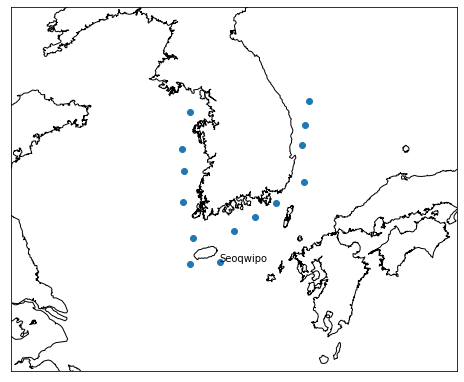

In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap


plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=40, llcrnrlat=30, llcrnrlon=120, urcrnrlon=135)
map.drawcoastlines()

KMA_Buoy_lon = KMA_Buoy_loc.iloc[:,2]  # KMA_Buoy 위치 (lon)
KMA_Buoy_lat = KMA_Buoy_loc.iloc[:,1]  # KMA_Buoy 위치 (lat)

loc_lon, loc_lat = map(KMA_Buoy_lon, KMA_Buoy_lat)
plt.scatter(loc_lon, loc_lat)



# 서귀포 위치 표시
text_lon, text_lat = map(KMA_Buoy_lon.iloc[10], KMA_Buoy_lat[10])
plt.text(text_lon, text_lat,'Seoqwipo')  




# 이번시간 실습

1. 동해에 위치한 한 부이를 선택하고 부이의 위체 옆에 이름을 시각화 

   (KMA_Buoy_loc 자료를 통해 부이의 이름과 위치를 알 수 있음)





In [ ]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap


plt.figure(figsize=(8, 8))
map = Basemap(projection='merc',resolution='i',
              urcrnrlat=40, llcrnrlat=30, llcrnrlon=120, urcrnrlon=135)
map.drawcoastlines()

KMA_Buoy_lon = KMA_Buoy_loc.iloc[:,2]  # KMA_Buoy 위치 (lon)
KMA_Buoy_lat = KMA_Buoy_loc.iloc[:,1]  # KMA_Buoy 위치 (lat)

loc_lon, loc_lat = map(KMA_Buoy_lon, KMA_Buoy_lat)
plt.scatter(loc_lon, loc_lat)



# 서귀포 위치 표시
text_lon, text_lat = map(KMA_Buoy_lon.iloc[10], KMA_Buoy_lat[10])

plt.text(text_lon, text_lat,'Seoqwipo')


In [ ]:
for i in range(np.size(KMA_Buoy_lon)):
  print(KMA_Buoy_loc.iloc[i,3])

 덕적도
 칠발도
 거문도
 거제도
 동해
 포항
 마라도
 외연도 
 추자도
 부안
 서귀포
 통영
 울산
 울진


# 이번시간 실습

1. 우리나라 인근에 있는 부이의 위치를 표시하고 지점 이름을 나타내기





In [ ]:
Soulik_Intensity = np.loadtxt('/content/drive/MyDrive/TC_study/TC_data/SOULIK_control_Intensity.txt')
Soulik_Location = np.loadtxt('/content/drive/MyDrive/TC_study/TC_data/SOULIK_control_Location.txt')

Soulik_JTWC = np.loadtxt('/content/drive/MyDrive/TC_study/TC_data/2018_SOULIK_info_JTWC.txt')
Soulik_RSMC = np.loadtxt('/content/drive/MyDrive/TC_study/TC_data/2018_SOULIK_info_RSMC.txt')

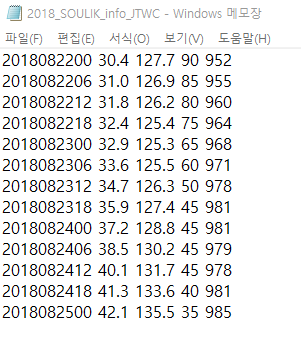

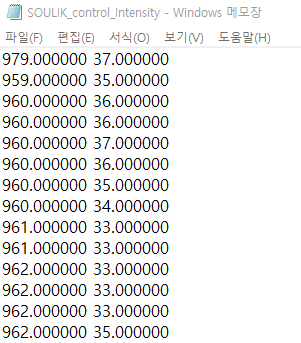

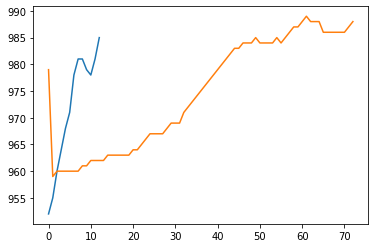

In [ ]:
plt.plot(Soulik_JTWC[:,4])
plt.plot(Soulik_Intensity[:,0])







([<matplotlib.axis.XTick at 0x7f4b411b1e50>,
 [Text(0, 0, '08-22'),
  Text(0, 0, '08-23'),
  Text(0, 0, '08-24'),
  Text(0, 0, '08-25')])

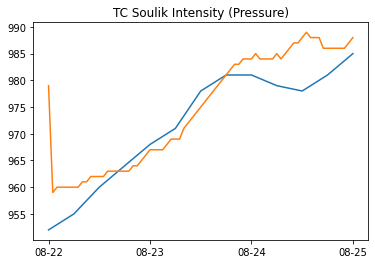

In [ ]:
# Model data 는 1시간 단위로 있고, 

plt.plot(np.arange(0,73,6),Soulik_JTWC[:,4])
plt.plot(Soulik_Intensity[:,0])


plt.title('TC Soulik Intensity (Pressure)')
plt.xticks(np.arange(0,73,24),labels=['08-22','08-23','08-24','08-25'])

# 이번시간 실습




2. JTWC best-track 자료와 모델(Model) 자료의 최대풍속 비교하기






([<matplotlib.axis.XTick at 0x7f4b4106f550>,
 [Text(0, 0, '08-22'),
  Text(0, 0, '08-23'),
  Text(0, 0, '08-24'),
  Text(0, 0, '08-25')])

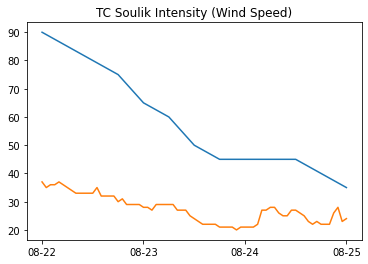

In [ ]:
# Model data 는 1시간 단위로 있고, 

plt.plot(np.arange(0,73,6),Soulik_JTWC[:,3]) 
plt.plot(Soulik_Intensity[:,1])


plt.title('TC Soulik Intensity (Wind Speed)')
plt.xticks(np.arange(0,73,24),labels=['08-22','08-23','08-24','08-25'])

In [ ]:
# 간단한 통계분석을 위한 툴 

def bias(predictions, targets):
  return (predictions - targets).mean()

def rmse(predictions, targets):
  return np.sqrt(((predictions - targets) ** 2 ).mean())

def corr(predictions, targets):
  cov = (np.sum( predictions * targets ) - len(predictions) * np.mean(predictions) * np.mean(targets)) / len(predictions)
  return cov / (np.std(predictions) * np.std(targets) )

# 이번시간 실습




2. JTWC best-track 자료와 모델(Model) 자료의 최대풍속에 대한 통계분석

   2-1. bias 구하기
   2-2. RMSE 구하기
   3-3. corr 구하기
   





In [ ]:
bias(Soulik_JTWC[:,3],Soulik_Intensity[0:74:6,1])

rmse(Soulik_JTWC[:,3],Soulik_Intensity[0:74:6,1])

corr(Soulik_JTWC[:,3],Soulik_Intensity[0:74:6,1])






0.9039027501673368